## Setup

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from wordcloud import WordCloud

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, roc_auc_score

import xgboost as xgb

In [5]:
kyc = pd.read_csv("../data/train/kyc_train.csv")

In [6]:
kyc

,Name,Gender,Occupation,Age,Tenure,cust_id,label
0,ASHLEE NEWMAN,other,Warehouse Worker,32.0,7.0,CUST80937207,0
1,BRANDI FERRELL,other,Unemployed,69.0,12.0,CUST19333434,0
2,DR.ROBERT CLARK,male,Warehouse Worker,36.0,7.0,CUST83340032,0
3,RENEE CANNON,female,Gemologist,32.0,3.0,CUST50455185,0
4,EDWARD ROBINSON,other,Nurse,40.0,12.0,CUST76306110,0
...,...,...,...,...,...,...,...
117468,JOHN PARKER,other,Forester,37.0,7.0,CUST67892089,0
117469,JAMES MARTINEZ,male,Gardener,23.0,0.0,CUST45467596,0
117470,PHILIP CAREY,male,Police Officer,35.0,12.0,CUST85447944,0
117471,ALAN FROST,male,Doctor,37.0,19.0,CUST55506353,0


## Looking at covariates between the diff groups

### Means and props

In [7]:
kyc.groupby('label')['Age'].mean()

label
0    35.679534
1    41.325567
Name: Age, dtype: float64

In [8]:
kyc.groupby('label')['Tenure'].mean()

label
0    6.400620
1    9.699849
Name: Tenure, dtype: float64

In [9]:
pd.crosstab(kyc['label'], kyc['Gender'], normalize='index')

Gender,female,male,other
label,,,
0,0.451790,0.449837,0.098373
1,0.456884,0.449924,0.093192


In [10]:
occ_crosstab = pd.crosstab(kyc['Occupation'], kyc['label'], normalize='columns')
occ_crosstab

label,0,1
Occupation,,
Actor,0.002190,0.000303
Actuary,0.002347,0.000303
Anesthesiologist,0.002102,0.000908
Animal Trainer,0.002952,0.000605
Antique Dealer,0.003731,0.007262
...,...,...
Waiter/Waitress,0.006657,0.002118
Warehouse Worker,0.010143,0.001513
Wedding Planner,0.007638,0.010590


We see that high-risk people are older and have longer tenure. However, there is no difference in gender distribution. One caveat is that tenure and age may be correlated. So we can look at the distributions in more detail. It's also hard to see if there is a discernible difference in the occupations.

### Plots

In [11]:
px.box(kyc, x='label', y='Age', title='Age Distribution by Group',
             labels={'label': 'Label', 'Age': 'Age'})

In [12]:
px.box(kyc, x='label', y='Tenure', title='Tenure Distribution by Group',
             labels={'label': 'Label', 'Tenure': 'Tenure'})

In [13]:
kyc['Age_bin'] = pd.cut(kyc['Age'], bins=[18-1, 25, 35, 45, 55, 65, 100], 
                        labels=['18-25', '26-35', '36-45', '46-55', '56-65', '66+'], ordered=True)
px.box(kyc, x='label', y='Tenure', facet_col='Age_bin',
            labels={'label':'Label', 'Tenure':'Tenure', 'Age_bin':'Age'},
            category_orders={"Age_bin": kyc['Age_bin'].cat.categories},
            title='Tenure Distribution by Age and Group')

In [14]:
kyc['Tenure_bin'] = pd.cut(kyc['Tenure'], bins=[0-1, 5, 10, 15, 20, 25, 30, 100], 
                           labels=['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '31+'], ordered=True)
px.box(kyc, x='label', y='Age', facet_col='Tenure_bin',
            labels={'label':'Label', 'Tenure_bin':'Tenure', 'Age':'Age'},
            category_orders={"Tenure_bin": kyc['Tenure_bin'].cat.categories},
            title='Age Distribution by Tenure and Group')

The above boxplots show that high-risk individuals have a longer tenure in almost all age categories, so high-risk people having higher ages and a longer tenure is not a statistical artifact induced by their correlation.

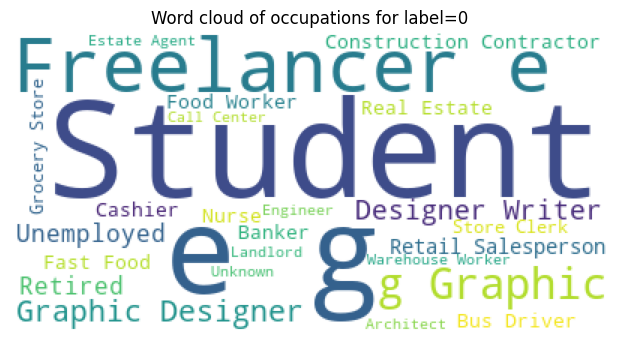

In [15]:
occs_0_combined = ' '.join(kyc[kyc['label']==0]["Occupation"])
wordcloud = WordCloud(background_color ='white', 
                min_font_size = 10).generate(occs_0_combined)

# Display the word cloud using matplotlib
plt.figure(figsize = (6,6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.title("Word cloud of occupations for label=0")
plt.tight_layout(pad = 0) 

plt.show()

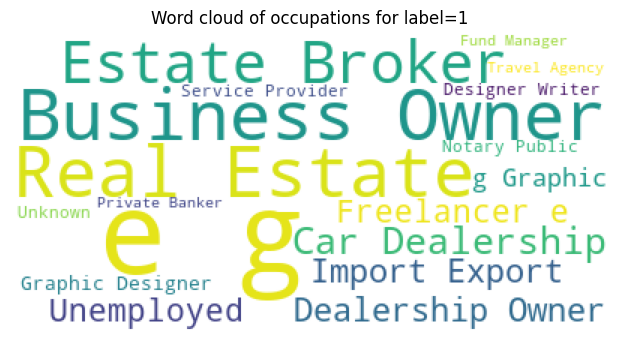

In [16]:
occs_1_combined = ' '.join(kyc[kyc['label']==1]["Occupation"])
wordcloud = WordCloud(background_color ='white', 
                min_font_size = 10).generate(occs_1_combined)

# Display the word cloud using matplotlib
plt.figure(figsize = (6,6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.title("Word cloud of occupations for label=1")
plt.tight_layout(pad = 0) 

plt.show()

In [17]:
px.imshow(occ_crosstab, x=occ_crosstab.columns, y=occ_crosstab.index, title="Heatmap of occupations")

Visually we can see some occupations light up in high-risk individuals and do not for low-risk individuals, like travel agency owner. There seems to only be one occupation which features heavily in low-risk individuals and not in higher-risk: being a student (lol). Because there are a lot of occupations (250 unique ones), it is difficult to manually see which ones have disparities (note that you have to mouse over the heat map to see all the occupations). We therefore take the difference of the crosstab, and see the ones with the largest positive and negative differences.

In [18]:
occ_crosstab_aug = occ_crosstab # copy cross tab to augment (aug) it
occ_crosstab_aug['diff'] = occ_crosstab_aug[1] - occ_crosstab_aug[0]

# 10 occupations with least high-risk vs low-risk
# the diff drops off fast after that so not worth it
print(occ_crosstab_aug.sort_values('diff').head(20))

label                              0         1      diff
Occupation                                              
Student                     0.029299  0.001513 -0.027786
Retail Salesperson          0.015083  0.002723 -0.012360
Cashier                     0.013042  0.000908 -0.012134
Retired                     0.015486  0.004236 -0.011250
Nurse                       0.011606  0.000605 -0.011001
Fast Food Worker            0.011685  0.000908 -0.010777
Grocery Store Clerk         0.010485  0.000605 -0.009879
Warehouse Worker            0.010143  0.001513 -0.008630
Physical Therapist          0.007752  0.000303 -0.007449
Postal Worker               0.007603  0.000303 -0.007300
Factory Worker              0.008479  0.001210 -0.007268
Call Center Representative  0.008680  0.001513 -0.007167
School Teacher              0.007384  0.000303 -0.007081
Home Health Aide            0.008645  0.001815 -0.006830
Dietician                   0.007620  0.000908 -0.006713
Bartender                   0.0

In [19]:
# 50 occupations with most high-risk vs low-risk
print(occ_crosstab_aug.sort_values('diff', ascending=False).head(50))

label                                                    0         1      diff
Occupation                                                                    
Real Estate Broker                                0.001542  0.034191  0.032649
Car Dealership Owner                              0.001401  0.030560  0.029158
Notary Public                                     0.001042  0.026626  0.025584
Private Banker                                    0.001104  0.020877  0.019774
Travel Agency Owner                               0.000946  0.020575  0.019629
Other                                             0.013419  0.031770  0.018351
Currency Exchange Owner                           0.000999  0.019062  0.018063
Cash-intensive Business Owner (e.g., Laundromat)  0.001069  0.018457  0.017388
Unknown                                           0.008908  0.026021  0.017113
Tax Advisor                                       0.000955  0.016944  0.015989
Casino Operator                                   0.

Therefore, maybe we should only choose occupations which have a high (absolute) difference, defined according to some statistical measure.

In [20]:
occ_crosstab_aug['abs_diff'] = abs(occ_crosstab_aug['diff'])

In [21]:
px.box(y=occ_crosstab_aug['abs_diff'], title="Box plot of absolute value of differences in occupation proportions")

It seems like if the absolute value of the diff is >0.0135, then the occupation is an outlier. There are 19 such occupations. This is a good cut off as it includes students, as well as the other occupations that we can visually see on the heat map. In fact, we can visualize only those.

In [28]:
OCC_DIFF_ABS_CUTOFF = 0.0135

occ_crosstab_imp = occ_crosstab[occ_crosstab_aug['abs_diff']>OCC_DIFF_ABS_CUTOFF][[0,1]]

In [30]:
fig = px.imshow(occ_crosstab_imp, x=occ_crosstab_imp.columns, y=occ_crosstab_imp.index, title="Heatmap of occupations with a notable difference between high-risk and low-risk")
fig.update_layout(font=dict(size=10), margin=dict(t=50, l=200))

In [31]:
# define low-risk and high-risk occupations based on that cutoff
low_risk_occs = occ_crosstab_aug[occ_crosstab_aug['diff'] < -OCC_DIFF_ABS_CUTOFF].index.to_list()
high_risk_occs = occ_crosstab_aug[occ_crosstab_aug['diff'] > OCC_DIFF_ABS_CUTOFF].index.to_list()

print("Low-risk occupations")
low_risk_occs

Low-risk occupations


['Student']

In [32]:
print("High-risk occupations")
high_risk_occs

High-risk occupations


['Car Dealership Owner',
 'Cash-intensive Business Owner (e.g., Laundromat)',
 'Casino Operator',
 'Cryptocurrency Trader',
 'Currency Exchange Owner',
 'Hedge Fund Manager',
 'Import/Export Business Owner',
 'Luxury Goods Dealer (e.g., Art, Jewelry)',
 'Maritime or Shipping Agent',
 'Nightclub or Bar Owner',
 'Notary Public',
 'Other',
 'Private Banker',
 'Real Estate Broker',
 'Tax Advisor',
 'Travel Agency Owner',
 'Trust and Company Service Provider',
 'Unknown']

## Modeling

### Feature engineering

HAVE TO REDO IT WITH THE TRAIN/VAL/TEST!

Based on the analysis above, we will use age (bins) and tenure (bins). For occupations, we will simply encode them as whether or not they are in the list of high-risk or low-risk occupations.

In [107]:
age_dummies = pd.get_dummies(kyc['Age_bin'])
kyc = pd.concat([kyc, age_dummies], axis=1)

In [85]:
# we already have age and tenure bins from the box plots above
kyc['is_low_risk_occ'] = kyc['Occupation'].isin(low_risk_occs)
kyc['is_high_risk_occ'] = kyc['Occupation'].isin(high_risk_occs)

### Dataset prep

In [119]:
X = kyc[['Age', 'Tenure', 'is_high_risk_occ', 'is_low_risk_occ']]
#X = kyc.drop(['label', 'Name', 'Gender', 'Occupation', 'Age', 'Age_bin', 'Tenure_bin', 'cust_id'], axis=1)  # Features
y = kyc['label']  # Target label
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)  # 70% training and 30% testing


### Model building

#### Decision tree

In [120]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

In [121]:
dt_predictions = dt_classifier.predict(X_test)
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_predictions))
print(classification_report(y_test, dt_predictions))

Decision Tree Accuracy: 0.9702742734562542
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     57055
           1       0.34      0.04      0.07      1682

    accuracy                           0.97     58737
   macro avg       0.66      0.52      0.53     58737
weighted avg       0.95      0.97      0.96     58737



#### Random forest

In [125]:
rf_classifier = RandomForestClassifier(random_state=42, class_weight='balanced')
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', random_state=42)

In [126]:
rf_predictions = rf_classifier.predict(X_test)

print("Random Forest Accuracy:", accuracy_score(y_test, rf_predictions))
print(classification_report(y_test, rf_predictions))


Random Forest Accuracy: 0.8505030900454569
              precision    recall  f1-score   support

           0       0.98      0.86      0.92     57055
           1       0.08      0.42      0.14      1682

    accuracy                           0.85     58737
   macro avg       0.53      0.64      0.53     58737
weighted avg       0.96      0.85      0.90     58737



In [129]:
y_probs = rf_classifier.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
auc = roc_auc_score(y_test, y_probs)

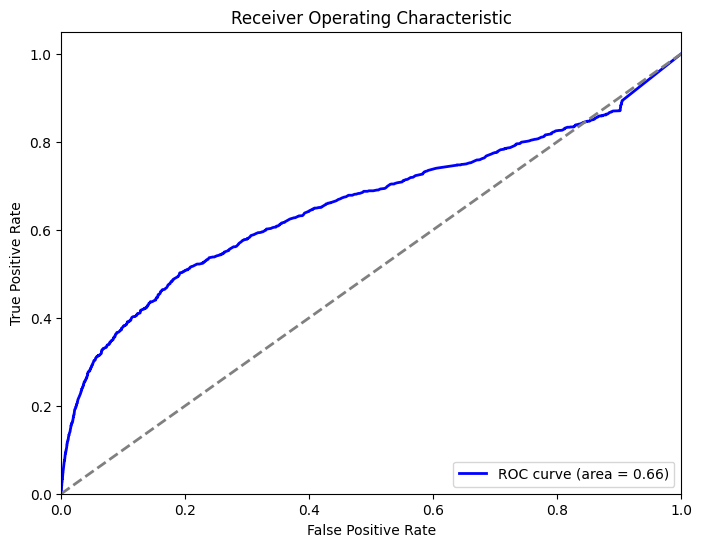

In [130]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

#### XGBoost

In [135]:
# Create DMatrix for XGBoost
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Define parameters (can be tuned)
params = {
    'max_depth': 3,
    'eta': 0.1,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'scale_pos_weight': sum(y == 0) / sum(y == 1)
}

# Train the model
num_rounds = 100
bst = xgb.train(params, dtrain, num_rounds)


In [136]:
xgb_preds = [round(x) for x in bst.predict(dtest)]

print("XGBoost Accuracy:", accuracy_score(y_test, xgb_preds))
print(classification_report(y_test, xgb_preds))

Random Forest Accuracy: 0.8184279074518617
              precision    recall  f1-score   support

           0       0.99      0.82      0.90     57055
           1       0.09      0.61      0.16      1682

    accuracy                           0.82     58737
   macro avg       0.54      0.72      0.53     58737
weighted avg       0.96      0.82      0.88     58737



In [137]:
y_probs = bst.predict(dtest)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
auc = roc_auc_score(y_test, y_probs)

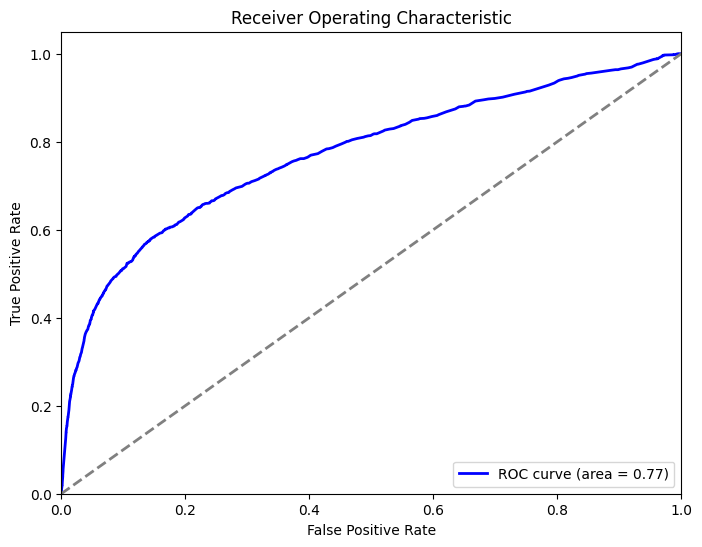

In [138]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()